** Setting up the library **

The library is currently available in the repository .... . In order to run it it is necesary to install 'bio.tilling' from the repository. 

NOTE: The functions declared in this workbook will be added to the package, so they won't be needed in the future, and the document will be upldated accordingly

In [1]:
require('bio.tilling')

Loading required package: bio.tilling


The first step is to read the table containging the raw coverage for all the exons to analyse. The ID of each row must be in the format: 'scaffold:start:end'. This is required as the region is subsequently parsed. The function 'readCoverageTable' reads the table and removes empty rows and exons where all the samples have a coverage of 0.

In [8]:
filename<-'input_example/Chromosome2BTest.tab'
covs<-readCoverageTable(filename)
head(covs)

,LIB11222_Cadenza0100,LIB10289_Cadenza0104,LIB10920_Cadenza0105,LIB10929_Cadenza0106,LIB10963_Cadenza0107,LIB11399_Cadenza0108,LIB11208_Cadenza0111,LIB11226_Cadenza0112,LIB10306_Cadenza0116,LIB10921_Cadenza0117,ellip.h,LIB11494_Control,LIB11495_Control,LIB11490_Control,LIB11491_Control,LIB10702_Control,LIB10704_Control,LIB10705_Control,LIB10706_Control,LIB5782_Control,LIB8440_Control
IWGSC_CSS_2BL_scaff_636814:5559:6078,200,109,222,185,154,138,128,167,123,176,⋯,250,233,302,247,136,108,155,100,200,39
IWGSC_CSS_2BL_scaff_636814:6165:6283,86,46,72,46,72,48,61,60,45,47,⋯,105,71,89,77,43,41,54,72,63,21
IWGSC_CSS_2BL_scaff_636814:6524:6689,164,78,159,131,97,125,104,123,90,121,⋯,227,184,269,209,122,95,139,89,303,49
IWGSC_CSS_2BL_scaff_636814:6787:6916,87,68,108,97,91,74,83,90,75,63,⋯,122,125,176,130,92,80,92,80,100,29
IWGSC_CSS_2BL_scaff_636814:7005:7099,155,104,160,132,116,86,88,136,94,101,⋯,172,169,280,189,107,128,137,117,71,40
IWGSC_CSS_2BL_scaff_636814:7207:7393,140,74,149,118,93,100,85,145,105,96,⋯,175,166,246,162,116,87,101,121,172,46


The next step is to filter out the samples with high variability. The default maximum standard deviation across the sample is of 0.3, with the values normalized to have an average coverage per exon of 1.  

In [9]:
ncol(covs)


[1] 489

In [10]:
covs<-filterSamplesPerSD(covs, maxSD=0.3)
ncol(covs)

[1] 445

The next step is to parse the name of each used row to get the scaffold, start, end and the exon length

In [11]:
df<-getExonsDF(covs)
head(df)

,Exon,Scaffold,Start,Ends,ExonL,sdExon
IWGSC_CSS_2BL_scaff_636814:5559:6078,IWGSC_CSS_2BL_scaff_636814:5559:6078,IWGSC_CSS_2BL_scaff_636814,5559,6078,519,45.28864
IWGSC_CSS_2BL_scaff_636814:6165:6283,IWGSC_CSS_2BL_scaff_636814:6165:6283,IWGSC_CSS_2BL_scaff_636814,6165,6283,118,16.6804
IWGSC_CSS_2BL_scaff_636814:6524:6689,IWGSC_CSS_2BL_scaff_636814:6524:6689,IWGSC_CSS_2BL_scaff_636814,6524,6689,165,37.08518
IWGSC_CSS_2BL_scaff_636814:6787:6916,IWGSC_CSS_2BL_scaff_636814:6787:6916,IWGSC_CSS_2BL_scaff_636814,6787,6916,129,27.03575
IWGSC_CSS_2BL_scaff_636814:7005:7099,IWGSC_CSS_2BL_scaff_636814:7005:7099,IWGSC_CSS_2BL_scaff_636814,7005,7099,94,37.41357
IWGSC_CSS_2BL_scaff_636814:7207:7393,IWGSC_CSS_2BL_scaff_636814:7207:7393,IWGSC_CSS_2BL_scaff_636814,7207,7393,186,33.64114


Then, we normalize the coverage so each exon has a mean of 1. 

In [14]:
mat<-normalizeCovs(covs, df)
head(mat)

,LIB11222_Cadenza0100,LIB10289_Cadenza0104,LIB10920_Cadenza0105,LIB10929_Cadenza0106,LIB10963_Cadenza0107,LIB11399_Cadenza0108,LIB11208_Cadenza0111,LIB11226_Cadenza0112,LIB10306_Cadenza0116,LIB10921_Cadenza0117,ellip.h,LIB11492_Control,LIB11493_Control,LIB11494_Control,LIB11495_Control,LIB11490_Control,LIB11491_Control,LIB10702_Control,LIB10704_Control,LIB10705_Control,LIB10706_Control
IWGSC_CSS_2BL_scaff_636814:5559:6078,1.079639,0.9146812,1.077298,1.160642,1.097451,0.8997595,1.108453,1.031059,0.9823628,1.087051,⋯,1.091472,0.9525973,0.9703872,0.9847083,0.9913939,1.064315,1.008098,0.8500118,1.067538,0.7976962
IWGSC_CSS_2BL_scaff_636814:6165:6283,1.295162,1.076907,0.9747479,0.8051212,1.431442,0.8731034,1.473718,1.033464,1.002666,0.8098643,⋯,1.018955,1.093118,1.137029,0.8371188,0.8150915,0.9256374,0.8892206,0.9002479,1.037582,1.602312
IWGSC_CSS_2BL_scaff_636814:6524:6689,1.129572,0.8351405,0.9844679,1.048623,0.8819779,1.03987,1.149112,0.9689332,0.9171303,0.9535521,⋯,0.9645418,1.082423,1.124223,0.9921817,1.126713,1.149056,1.15384,0.9539959,1.221485,0.9058354
IWGSC_CSS_2BL_scaff_636814:6787:6916,0.8080711,0.9818249,0.9017546,1.04708,1.115803,0.8301584,1.236709,0.9560738,1.030647,0.6695142,⋯,0.7891962,0.915392,0.8147921,0.9089575,0.9941087,0.9638253,1.173367,1.083361,1.090238,1.098018
IWGSC_CSS_2BL_scaff_636814:7005:7099,0.9986671,1.041639,0.926709,0.9884187,0.9866495,0.669247,0.9095587,1.002182,0.8960564,0.7445595,⋯,0.9935187,0.918159,0.7968456,0.8524698,1.097079,0.9720208,0.9466478,1.202408,1.126193,1.113946
IWGSC_CSS_2BL_scaff_636814:7207:7393,1.024577,0.8418661,0.9802505,1.003636,0.8984942,0.883925,0.9979169,1.213677,1.136905,0.803853,⋯,1.007594,1.111134,0.9208972,0.9511035,1.094819,0.9463595,1.165709,0.9283003,0.9430635,1.308552


We remove the original table of coverages to reduce the memory footprint

In [15]:
rm(covs)

We filter the exons with high variation (with a standard deviation over 0.3) and we parse again the row names to have a dataframe only with the selected exons. Note that the "sdExon" column, containing the standard deviation of each exon, now reflect the normalized values. 

In [17]:
nrow(mat)

[1] 7653

In [18]:
mat<-filterLowQualityExons(mat, maxSD=0.3)
df<-getExonsDF(mat)
nrow(mat)

[1] 7653

In [19]:
head(df)

,Exon,Scaffold,Start,Ends,ExonL,sdExon
IWGSC_CSS_2BL_scaff_636814:5559:6078,IWGSC_CSS_2BL_scaff_636814:5559:6078,IWGSC_CSS_2BL_scaff_636814,5559,6078,519,0.129808
IWGSC_CSS_2BL_scaff_636814:6165:6283,IWGSC_CSS_2BL_scaff_636814:6165:6283,IWGSC_CSS_2BL_scaff_636814,6165,6283,118,0.2025156
IWGSC_CSS_2BL_scaff_636814:6524:6689,IWGSC_CSS_2BL_scaff_636814:6524:6689,IWGSC_CSS_2BL_scaff_636814,6524,6689,165,0.1358607
IWGSC_CSS_2BL_scaff_636814:6787:6916,IWGSC_CSS_2BL_scaff_636814:6787:6916,IWGSC_CSS_2BL_scaff_636814,6787,6916,129,0.1765368
IWGSC_CSS_2BL_scaff_636814:7005:7099,IWGSC_CSS_2BL_scaff_636814:7005:7099,IWGSC_CSS_2BL_scaff_636814,7005,7099,94,0.1713981
IWGSC_CSS_2BL_scaff_636814:7207:7393,IWGSC_CSS_2BL_scaff_636814:7207:7393,IWGSC_CSS_2BL_scaff_636814,7207,7393,186,0.1734013


Then we categorize each exon as deleted or not deleted. The resulting dataframe only include the exons with a putative deletion. 
The columns are the following: 
* **Exon** The name of the exon from the matrix
* **Library** The library where the deletion appears. 
* **NormCov** The normalized coverage of the library in the given exon. 
* **HomDel** Homozygous deletion, the normalized coverage is less than 0.1
* **HetDel1** Heterozygous deletion, the Normalized Coverage is less than 0.5 + sdExon
* **Scaffold** The scaffold where the exon is located
* **Start** Starting positionof the exon

To consider anything as a deletion, the value must also be below 1 - sdLibrary (standard deviation in the library). We get that value later on to be able to plot those cases.

In [23]:
dels<-getAllDeletedExons(mat,df)
head(dels)

,Exon,Library,NormCov,HomDel,HetDel1,Scaffold,Start
135,IWGSC_CSS_2BL_scaff_6521114:16953:17067,LIB11222_Cadenza0100,0.7314991,FALSE,TRUE,IWGSC_CSS_2BL_scaff_6521114,16953
205,IWGSC_CSS_2BL_scaff_7910419:3047:3175,LIB11222_Cadenza0100,0.7062092,FALSE,TRUE,IWGSC_CSS_2BL_scaff_7910419,3047
236,IWGSC_CSS_2BL_scaff_7932617:5933:5973,LIB11222_Cadenza0100,0.7025895,FALSE,TRUE,IWGSC_CSS_2BL_scaff_7932617,5933
414,IWGSC_CSS_2BL_scaff_7940099:806:865,LIB11222_Cadenza0100,0.7817671,FALSE,TRUE,IWGSC_CSS_2BL_scaff_7940099,806
460,IWGSC_CSS_2BL_scaff_7943058:11135:11256,LIB11222_Cadenza0100,0.6050065,FALSE,TRUE,IWGSC_CSS_2BL_scaff_7943058,11135
462,IWGSC_CSS_2BL_scaff_7943058:12501:12655,LIB11222_Cadenza0100,0.7134812,FALSE,TRUE,IWGSC_CSS_2BL_scaff_7943058,12501


We get the standard deviation of each library, to be able to plot them

In [24]:
libSD<-getLibSD(mat)
head(libSD)

LIB11222_Cadenza0100 LIB10289_Cadenza0104 LIB10920_Cadenza0105 
           0.1502336            0.1611375            0.1353060 
LIB10929_Cadenza0106 LIB10963_Cadenza0107 LIB11399_Cadenza0108 
           0.1525334            0.1390661            0.1592261

Then we want to identify which scaffolds have deletions and how many of the exons have a deletion. 

In [26]:
scaffsWithDels<-getAllScaffoldsWithDeletions(df,dels)
head(scaffsWithDels)

,Scaffold,Library,validExons,HetDels,HomDels
1,IWGSC_CSS_2BL_scaff_1218769,LIB10289_Cadenza0104,11,1,0
2,IWGSC_CSS_2BL_scaff_1218769,LIB10946_Cadenza0142,11,1,0
3,IWGSC_CSS_2BL_scaff_1218769,LIB10681_Cadenza0156,11,1,0
4,IWGSC_CSS_2BL_scaff_1218769,LIB10953_Cadenza0166,11,1,0
5,IWGSC_CSS_2BL_scaff_1218769,LIB10612_Cadenza0290,11,1,0
6,IWGSC_CSS_2BL_scaff_1218769,LIB10668_Cadenza0297,11,1,0


To get a better idea of how the deletions are behaving, we calculate more statistics for each exon. The stats are calculated for every exon, regardless of it having a deletion or not. 
For each library several counts, averages and standard deviations are calculated. The criteria to include an exon in the agregated category are the following. :

* **All** All the exons in a scaffold 
* **NoHom** Exons that have a coverage >  0.1
* **No3SigmaDel** Exons that have a coverage > 1-3 * sdExon
* **NoHet** Exons that have a coverage > 0.5 + sdExon
* **Het** Exons that have a coverage < 0.5 + sdExon and coverage < 1-3 * sdExon
* **Hom** Exons that have a coverage < 0.1 and coverage < 1-3 * sdExon
Note that the categories are not exclusive. 

This routine takes around 24 hours to run in 455 lines on hexaploid wheat. To monitor the progrss a progress bar is displayed. If you don't want to show the progress bar (using on a cluster without X11), you can add the argument: showProgressBar = F

deslWithAVGs<-getAllScaffoldAverages(scaffsWithDels, mat,df)

In [28]:
head(deslWithAVGs)

,Scaffold,Library,AllCount,AllAvg,AllSD,NoHomCount,NoHomAvg,NoHomSD,No3SigmaDelCount,No3SigmaDelAvg,No3SigmaDelSD,NoHetCount,NoHetAvg,NoHetSD,HetCount,HetAvg,HetSD,HomCount,HomAvg,HomSD
1,IWGSC_CSS_2BL_scaff_1218769,LIB10289_Cadenza0104,11,0.970092965470647,0.147371420597695,11,0.970092965470647,0.147371420597695,11,0.970092965470647,0.147371420597695,11,0.970092965470647,0.147371420597695,0,NaN,NA,0,NaN,NA
2,IWGSC_CSS_2BL_scaff_1218769,LIB10946_Cadenza0142,11,0.921547575932769,0.156790373005512,11,0.921547575932769,0.156790373005512,11,0.921547575932769,0.156790373005512,10,0.955488630116337,0.115042380196733,1,0.582137034097087,NA,0,NaN,NA
3,IWGSC_CSS_2BL_scaff_1218769,LIB10681_Cadenza0156,11,1.10028268921261,0.184904716669132,11,1.10028268921261,0.184904716669132,11,1.10028268921261,0.184904716669132,10,1.14643951089445,0.109314938396801,1,0.638714472394169,NA,0,NaN,NA
4,IWGSC_CSS_2BL_scaff_1218769,LIB10953_Cadenza0166,11,0.924623690103455,0.142443653529494,11,0.924623690103455,0.142443653529494,11,0.924623690103455,0.142443653529494,11,0.924623690103455,0.142443653529494,0,NaN,NA,0,NaN,NA
5,IWGSC_CSS_2BL_scaff_1218769,LIB10612_Cadenza0290,11,1.00794804610109,0.235755359027047,11,1.00794804610109,0.235755359027047,10,1.04961711558079,0.201332131468898,10,1.04961711558079,0.201332131468898,1,0.591257351304103,NA,0,NaN,NA
6,IWGSC_CSS_2BL_scaff_1218769,LIB10668_Cadenza0297,11,1.02614260537532,0.267305660975132,11,1.02614260537532,0.267305660975132,11,1.02614260537532,0.267305660975132,10,1.08236171879271,0.201896124396072,1,0.463951471201401,NA,0,NaN,NA


In [29]:
nrow(deslWithAVGs)

[1] 65945

To get a single value that can be used to filter the following score is used:

score=HetCount/No3SigmaDelCount

Since all the HetCount are also HomCount, the formula works to highlight the cases where there are more putative deleted exons than non-deleted exons.  


In [31]:

getDeletionScore<-function(df) {
	ret <- as.numeric(df$HetCount) / as.numeric(df$No3SigmaDelCount)
	ret
}

In [37]:
delsWithScores <- deslWithAVGs
delsWithScores$Score<-getDeletionScore(delsWithScores)
head(delsWithScores)

,Scaffold,Library,AllCount,AllAvg,AllSD,NoHomCount,NoHomAvg,NoHomSD,No3SigmaDelCount,No3SigmaDelAvg,ellip.h,NoHetCount,NoHetAvg,NoHetSD,HetCount,HetAvg,HetSD,HomCount,HomAvg,HomSD,Score
1,IWGSC_CSS_2BL_scaff_1218769,LIB10289_Cadenza0104,11,0.970092965470647,0.147371420597695,11,0.970092965470647,0.147371420597695,11,0.970092965470647,⋯,11,0.970092965470647,0.147371420597695,0,NaN,NA,0,NaN,NA,0
2,IWGSC_CSS_2BL_scaff_1218769,LIB10946_Cadenza0142,11,0.921547575932769,0.156790373005512,11,0.921547575932769,0.156790373005512,11,0.921547575932769,⋯,10,0.955488630116337,0.115042380196733,1,0.582137034097087,NA,0,NaN,NA,0.09090909
3,IWGSC_CSS_2BL_scaff_1218769,LIB10681_Cadenza0156,11,1.10028268921261,0.184904716669132,11,1.10028268921261,0.184904716669132,11,1.10028268921261,⋯,10,1.14643951089445,0.109314938396801,1,0.638714472394169,NA,0,NaN,NA,0.09090909
4,IWGSC_CSS_2BL_scaff_1218769,LIB10953_Cadenza0166,11,0.924623690103455,0.142443653529494,11,0.924623690103455,0.142443653529494,11,0.924623690103455,⋯,11,0.924623690103455,0.142443653529494,0,NaN,NA,0,NaN,NA,0
5,IWGSC_CSS_2BL_scaff_1218769,LIB10612_Cadenza0290,11,1.00794804610109,0.235755359027047,11,1.00794804610109,0.235755359027047,10,1.04961711558079,⋯,10,1.04961711558079,0.201332131468898,1,0.591257351304103,NA,0,NaN,NA,0.1
6,IWGSC_CSS_2BL_scaff_1218769,LIB10668_Cadenza0297,11,1.02614260537532,0.267305660975132,11,1.02614260537532,0.267305660975132,11,1.02614260537532,⋯,10,1.08236171879271,0.201896124396072,1,0.463951471201401,NA,0,NaN,NA,0.09090909


In [38]:
selectedDels<-delsWithScores[delsWithScores$Score>=1,]
head(selectedDels)

,Scaffold,Library,AllCount,AllAvg,AllSD,NoHomCount,NoHomAvg,NoHomSD,No3SigmaDelCount,No3SigmaDelAvg,ellip.h,NoHetCount,NoHetAvg,NoHetSD,HetCount,HetAvg,HetSD,HomCount,HomAvg,HomSD,Score
52,IWGSC_CSS_2BL_scaff_1218769,LIB10293_Cadenza1498,11,0.035879415675697,0.0508524201509302,2,0.127862922946016,0.0271171741011591,0,NaN,⋯,0,NaN,NA,11,0.035879415675697,0.0508524201509302,9,0.0154386362822927,0.0235637031296246,Inf
237,IWGSC_CSS_2BL_scaff_1810970,LIB11411_Cadenza2072,18,0.554710414691224,0.0883068165301251,18,0.554710414691224,0.0883068165301251,10,0.594579944239153,⋯,2,0.661720824345694,0.0451909035280645,16,0.541334113484415,0.0835703755815126,0,NaN,NA,1.6
462,IWGSC_CSS_2BL_scaff_3869475,LIB10293_Cadenza1498,15,0.00889019101344626,0.0105280112545821,0,NaN,NA,0,NaN,⋯,0,NaN,NA,15,0.00889019101344626,0.0105280112545821,15,0.00889019101344626,0.0105280112545821,Inf
609,IWGSC_CSS_2BL_scaff_3918507,LIB10293_Cadenza1498,18,0.0209805268078696,0.0417235369181854,1,0.169860648815968,NA,0,NaN,⋯,0,NaN,NA,18,0.0209805268078696,0.0417235369181854,17,0.0122228725720991,0.0195661996503242,Inf
947,IWGSC_CSS_2BL_scaff_6521114,LIB10293_Cadenza1498,12,0.068699579382272,0.127555932721034,3,0.243703124087056,0.164778885682955,2,0.27417512909134,⋯,0,NaN,NA,12,0.068699579382272,0.127555932721034,9,0.0103650644806774,0.0164565743886445,6
1083,IWGSC_CSS_2BL_scaff_6692662,LIB11440_Cadenza0654,10,0.606942286703231,0.122977520114531,10,0.606942286703231,0.122977520114531,6,0.677847638148166,⋯,2,0.80279253912539,0.0368402720190178,8,0.557979723597692,0.0745086044932163,0,NaN,NA,1.333333


In [39]:
nrow(selectedDels)

[1] 201

We can plot the coverage on specific scaffolds to see if the putative deletion is consistent and how variable the involved exons are. The labels in the plot includes:
    
* The line being ploted
* A box plot representing the variation across the exon
* The gray wiskers shos the 3Sigma limit
* The dots in the plot of the coverage in the line highlight if it was called a deletion or not, and the reason. 
* **Max. for Het** is the threshold for heterozygous deletions (0.5 + sdExon)

                     Var2                                  exon
58   LIB10293_Cadenza1498   IWGSC_CSS_2BL_scaff_1218769:12:1122
503  LIB10293_Cadenza1498 IWGSC_CSS_2BL_scaff_1218769:1390:1539
948  LIB10293_Cadenza1498 IWGSC_CSS_2BL_scaff_1218769:1760:1831
1393 LIB10293_Cadenza1498 IWGSC_CSS_2BL_scaff_1218769:1924:2184
1838 LIB10293_Cadenza1498 IWGSC_CSS_2BL_scaff_1218769:2292:2423
2283 LIB10293_Cadenza1498 IWGSC_CSS_2BL_scaff_1218769:2505:2756
                                      Exon                    Scaffold Start
58     IWGSC_CSS_2BL_scaff_1218769:12:1122 IWGSC_CSS_2BL_scaff_1218769    12
503  IWGSC_CSS_2BL_scaff_1218769:1390:1539 IWGSC_CSS_2BL_scaff_1218769  1390
948  IWGSC_CSS_2BL_scaff_1218769:1760:1831 IWGSC_CSS_2BL_scaff_1218769  1760
1393 IWGSC_CSS_2BL_scaff_1218769:1924:2184 IWGSC_CSS_2BL_scaff_1218769  1924
1838 IWGSC_CSS_2BL_scaff_1218769:2292:2423 IWGSC_CSS_2BL_scaff_1218769  2292
2283 IWGSC_CSS_2BL_scaff_1218769:2505:2756 IWGSC_CSS_2BL_scaff_1218769  2505
     Ends Exo

Warning message:
: Removed 8 rows containing missing values (geom_point).Warning message:
: Removed 7 rows containing missing values (geom_point).Warning message:
: Removed 2 rows containing missing values (geom_point).Warning message:
: Removed 8 rows containing missing values (geom_point).Warning message:
: Removed 7 rows containing missing values (geom_point).Warning message:
: Removed 5 rows containing missing values (geom_point).Warning message:
: Removed 6 rows containing missing values (geom_point).Warning message:
: Removed 5 rows containing missing values (geom_point).Warning message:
: Removed 5 rows containing missing values (geom_point).Warning message:
: Removed 9 rows containing missing values (geom_point).Warning message:
: Removed 8 rows containing missing values (geom_point).

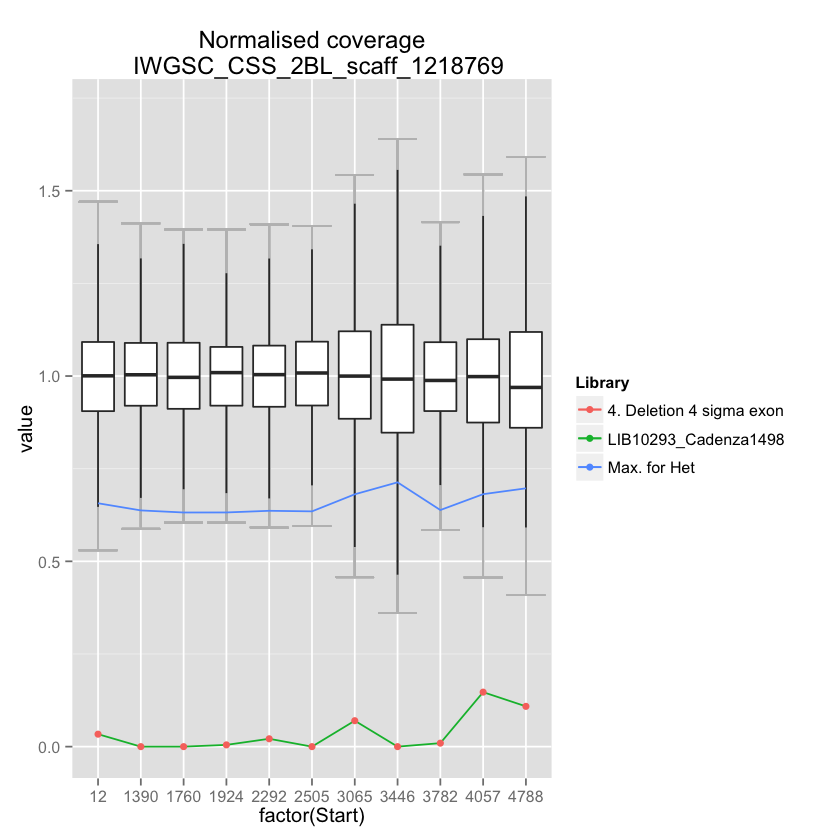

In [41]:
plotLibraryOnScaffold("IWGSC_CSS_2BL_scaff_1218769","LIB10293_Cadenza1498", df,mat, delsWithAvs, libSD)

Scaffold IWGSC_CSS_2BL_scaff_7939376 has a small deletion within on library LIB10929_Cadenza0106. We haven't tested this kind of deletions as we didn't have plant material on the few that we have identified. 

                     Var2                                  exon
183  LIB10929_Cadenza0106 IWGSC_CSS_2BL_scaff_7939376:4023:4466
628  LIB10929_Cadenza0106 IWGSC_CSS_2BL_scaff_7939376:4618:4711
1073 LIB10929_Cadenza0106 IWGSC_CSS_2BL_scaff_7939376:4974:5039
1518 LIB10929_Cadenza0106 IWGSC_CSS_2BL_scaff_7939376:5856:5946
1963 LIB10929_Cadenza0106 IWGSC_CSS_2BL_scaff_7939376:6174:6256
2408 LIB10929_Cadenza0106 IWGSC_CSS_2BL_scaff_7939376:6336:6404
                                      Exon                    Scaffold Start
183  IWGSC_CSS_2BL_scaff_7939376:4023:4466 IWGSC_CSS_2BL_scaff_7939376  4023
628  IWGSC_CSS_2BL_scaff_7939376:4618:4711 IWGSC_CSS_2BL_scaff_7939376  4618
1073 IWGSC_CSS_2BL_scaff_7939376:4974:5039 IWGSC_CSS_2BL_scaff_7939376  4974
1518 IWGSC_CSS_2BL_scaff_7939376:5856:5946 IWGSC_CSS_2BL_scaff_7939376  5856
1963 IWGSC_CSS_2BL_scaff_7939376:6174:6256 IWGSC_CSS_2BL_scaff_7939376  6174
2408 IWGSC_CSS_2BL_scaff_7939376:6336:6404 IWGSC_CSS_2BL_scaff_7939376  6336
     Ends Exo

Warning message:
: Removed 4 rows containing missing values (geom_point).Warning message:
: Removed 9 rows containing missing values (geom_point).Warning message:
: Removed 4 rows containing missing values (geom_point).Warning message:
: Removed 8 rows containing missing values (geom_point).Warning message:
: Removed 11 rows containing missing values (geom_point).Warning message:
: Removed 2 rows containing missing values (geom_point).Warning message:
: Removed 16 rows containing missing values (geom_point).Warning message:
: Removed 16 rows containing missing values (geom_point).Warning message:
: Removed 10 rows containing missing values (geom_point).Warning message:
: Removed 6 rows containing missing values (geom_point).Warning message:
: Removed 1 rows containing missing values (geom_point).Warning message:
: Removed 4 rows containing missing values (geom_point).Warning message:
: Removed 8 rows containing missing values (geom_point).Warning message:
: Removed 2 rows containing mi

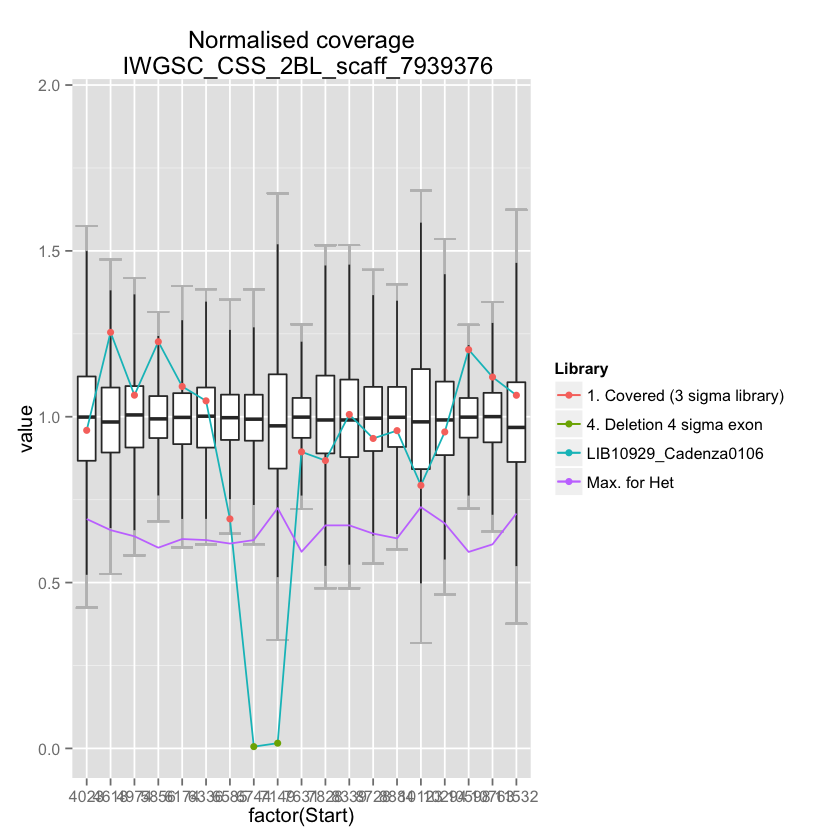

In [40]:

plotLibraryOnScaffold("IWGSC_CSS_2BL_scaff_7939376","LIB10929_Cadenza0106", df,mat, delsWithAvs, libSD)

In order to get the positions of the deletions within the chromosome we can load a genetic map with the positions of the scaffolds. 

In [42]:
geneticMap<-read.csv('input_example/chapman2BIWGSC.csv', header=T)
head(geneticMap)

,contig,chr,cM
1,IWGSC_CSS_1BS_scaff_1529189,2B,0
2,IWGSC_CSS_1BS_scaff_3436781,2B,0
3,IWGSC_CSS_2BS_scaff_1085238,2B,0
4,IWGSC_CSS_2BS_scaff_1172235,2B,0
5,IWGSC_CSS_2BS_scaff_1172260,2B,0
6,IWGSC_CSS_2BS_scaff_1265247,2B,0


Function to select the genetic map 

In [69]:
getDeletionCategory<-function(df,threshold=0.8) {
	ratio<- as.numeric(df$HomCount) / as.numeric(df$HetCount)  > threshold
	type<-ifelse(ratio, 'Hom', 'Het')
	type
}

getDeletionsPerCM<-function(geneticMap,selectedDels, mat){
    library(sqldf)
    selectedDels$category<-getDeletionCategory(selectedDels)
    exonCounts<-sqldf('SELECT Scaffold, Count(*) as exonCount from df group by Scaffold')
    usedScaffoldsPerCM<-sqldf('SELECT chr, cM, count(*) as ScaffoldCount
FROM geneticMap 
LEFT JOIN exonCounts on Scaffold=contig  
WHERE exonCount > 9
GROUP BY chr, CM
ORDER BY  chr, cM')
    
    homDels<-sqldf("SELECT chr, cM, Library,  count(*) as HomDels 
FROM geneticMap
LEFT JOIN selectedDels on Scaffold = contig
WHERE category = 'Hom'
GROUP BY chr, cM, Library")
    hetDels<-sqldf("SELECT chr, cM, Library,  count(*) as HetDels 
FROM geneticMap
LEFT JOIN selectedDels on Scaffold = contig
WHERE category = 'Het'
GROUP BY chr, cM, Library")
    libraries<-data.frame(Library=colnames(mat))
    mapsForLibraries<-sqldf("SELECT * FROM usedScaffoldsPerCM, libraries ")
    tableWithAllDeletions<-sqldf(
"SELECT mapsForLibraries.*,
    ifnull(hetDels.HetDels, 0) as HetDels, 
    ifnull(homDels.HomDels, 0) as HomDels
FROM mapsForLibraries
LEFT JOIN hetDels 
    ON  mapsForLibraries.chr     = hetDels.chr
    AND mapsForLibraries.cM      = hetDels.cM 
    AND mapsForLibraries.Library = hetDels.Library 
LEFT JOIN homDels 
    ON  mapsForLibraries.chr     = homDels.chr
    AND mapsForLibraries.cM      = homDels.cM 
    AND mapsForLibraries.Library = homDels.Library ")

    tableWithAllDeletions$hetDelsPer<-tableWithAllDeletions$HetDels/tableWithAllDeletions$ScaffoldCount
    tableWithAllDeletions$homDelsPer<-tableWithAllDeletions$HomDels/tableWithAllDeletions$ScaffoldCount
    tableWithAllDeletions
}

plotDeletionsInScaffold <-function(geneticMapWithDeletions, chromosome, library){
	library(ggplot2)

	toPlot  <-geneticMapWithDeletions[geneticMapWithDeletions$chr == chromosome & geneticMapWithDeletions$Library == library,]
	toPlot <- toPlot[toPlot$ScaffoldCount > 1,]
    hetPlot <- toPlot$hetDels
	homPlot <- toPlot$homDels
	formatedToPlotHet <- data.frame(chr=toPlot$chr, cM=toPlot$cM, type="hetDel", value=hetPlot)
	formatedToPlotHom <- data.frame(chr=toPlot$chr, cM=toPlot$cM, type="homDel", value=homPlot)
	mixPlot<-rbind(formatedToPlotHet, formatedToPlotHom)
	ggplot(data=mixPlot, aes(x=cM, y=value, group=type, colour=type)) +
    geom_line() + geom_point()  +
    scale_y_log10(limits=c(0.001, 1), breaks=c(0.1, 0.25, 0.5, 0.75, 1)) +  
    ylab("Percentage of scaffolds with deletion") +
    xlab("centiMorgan") + 
    ggtitle(paste("Chromosome", chromosome , "\n", library))

}


In [70]:
tableWithAllDels <- getDeletionsPerCM(geneticMap,selectedDels, mat)

In [71]:
head(tableWithAllDels)

,chr,cM,ScaffoldCount,Library,HetDels,HomDels,hetDelsPer,homDelsPer
1,2B,0,4,LIB11222_Cadenza0100,0,0,0,0
2,2B,0,4,LIB10289_Cadenza0104,0,0,0,0
3,2B,0,4,LIB10920_Cadenza0105,0,0,0,0
4,2B,0,4,LIB10929_Cadenza0106,0,0,0,0
5,2B,0,4,LIB10963_Cadenza0107,0,0,0,0
6,2B,0,4,LIB11399_Cadenza0108,0,0,0,0


In [72]:
tableWithAllDels[tableWithAllDels$chr == "2B" & tableWithAllDels$Library == "LIB10293_Cadenza1498",]

,chr,cM,ScaffoldCount,Library,HetDels,HomDels,hetDelsPer,homDelsPer
278,2B,0,4,LIB10293_Cadenza1498,0,0,0,0
723,2B,6.832,1,LIB10293_Cadenza1498,0,0,0,0
1168,2B,13.658,1,LIB10293_Cadenza1498,0,0,0,0
1613,2B,15.931,6,LIB10293_Cadenza1498,0,0,0,0
2058,2B,17.067,2,LIB10293_Cadenza1498,0,0,0,0
2503,2B,19.34,2,LIB10293_Cadenza1498,0,0,0,0
2948,2B,20.4775,1,LIB10293_Cadenza1498,0,0,0,0
3393,2B,23.8885,1,LIB10293_Cadenza1498,0,0,0,0
3838,2B,33.023,4,LIB10293_Cadenza1498,0,0,0,0
4283,2B,34.16,1,LIB10293_Cadenza1498,0,0,0,0


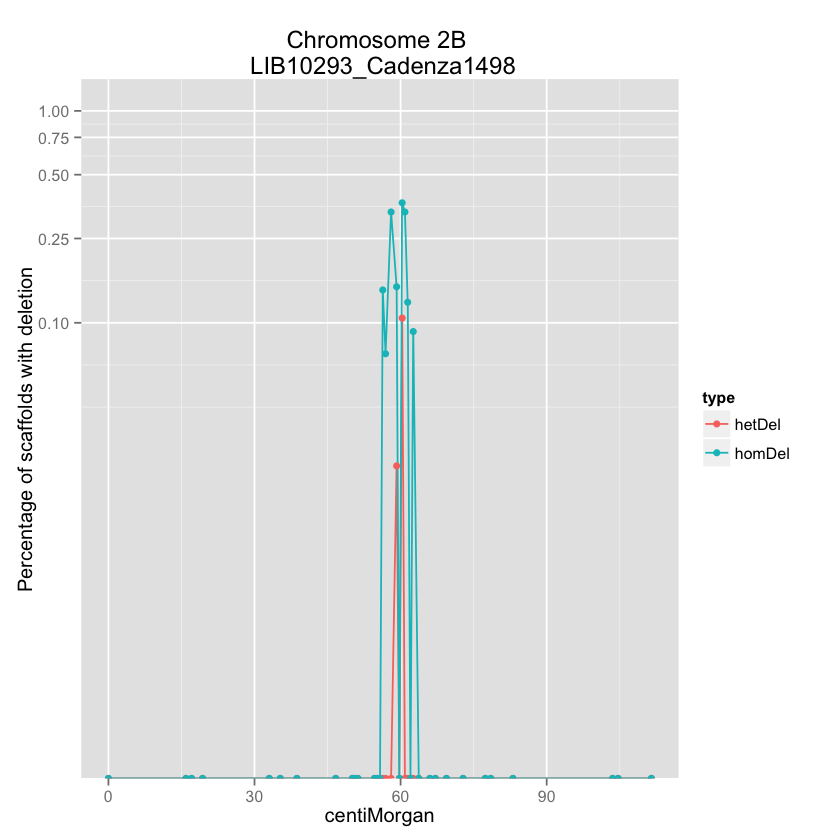

In [74]:
plotDeletionsInScaffold(tableWithAllDels,"2B","LIB10293_Cadenza1498")